In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import zipfile
import os

In [ ]:
# Specify the source ZIP file and the destination folder
source_zip_path =  "/content/drive/MyDrive/NayaProject/NayaData.zip"


destination_folder =  "/content/drive/MyDrive/NayaProject"


In [ ]:
# Unzip the file into the specified folder
!unzip $source_zip_path -d $destination_folder

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/NayaProject/NayaData/input/train/Potato___healthy/Healthy (199).jpg  
  inflating: /content/drive/MyDrive/NayaProject/NayaData/input/train/Potato___healthy/Healthy (2).jpg  
  inflating: /content/drive/MyDrive/NayaProject/NayaData/input/train/Potato___healthy/Healthy (20).jpg  
  inflating: /content/drive/MyDrive/NayaProject/NayaData/input/train/Potato___healthy/Healthy (200).jpg  
  inflating: /content/drive/MyDrive/NayaProject/NayaData/input/train/Potato___healthy/Healthy (201).jpg  
  inflating: /content/drive/MyDrive/NayaProject/NayaData/input/train/Potato___healthy/Healthy (202).jpg  
  inflating: /content/drive/MyDrive/NayaProject/NayaData/input/train/Potato___healthy/Healthy (203).jpg  
  inflating: /content/drive/MyDrive/NayaProject/NayaData/input/train/Potato___healthy/Healthy (204).jpg  
  inflating: /content/drive/MyDrive/NayaProject/NayaData/input/train/Potato___healthy/Healthy (205).jpg 

In [2]:
import tensorflow as tf
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import Dense,Flatten,Conv2D,MaxPooling2D
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers  import Concatenate
from tensorflow.keras.layers import AveragePooling2D, Dropout, Input, BatchNormalization
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix
from PIL import Image
from tqdm import tqdm
import urllib
from tensorflow.keras.preprocessing import image
from sklearn.metrics import precision_recall_curve,roc_curve, auc
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt
import os
from sklearn.metrics import log_loss, brier_score_loss
from sklearn.metrics import cohen_kappa_score
import matplotlib.cm as cm
from sklearn.metrics import matthews_corrcoef
import pandas as pd
import seaborn as sns
import numpy as np
import cv2
from sklearn.preprocessing import label_binarize
from sklearn.metrics import average_precision_score
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Activation, BatchNormalization, Conv2D, Dense, Dropout, Flatten, MaxPooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.regularizers import l2

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.applications import VGG19
from tensorflow.keras.optimizers import Adam




%matplotlib inline

In [3]:
image_path = '/content/drive/MyDrive/NayaProject/NayaData/input/train/'

In [4]:
train_image_path = '/content/drive/MyDrive/NayaProject/NayaData/input/train/'
valid_image_path = '/content/drive/MyDrive/NayaProject/NayaData/input/valid/'

In [5]:
test_image_path='/content/drive/MyDrive/NayaProject/NayaData/input/test/'

In [6]:
#CLASS NAME
class_names = os.listdir(image_path)
print(class_names)

['Corn___Common_rust', 'Corn___healthy', 'Corn___Northern_Leaf_Blight', 'Not_a_Leaf', 'Potato___Early_blight', 'Potato___healthy', 'Potato___Late_blight', 'Strawberry___healthy', 'Strawberry___Leaf_scorch']


In [ ]:
from PIL import Image

def create_data_frame(path):
    list_plant=[]
    list_category=[]
    list_disease=[]
    list_path=[]
    list_plant_category=[]
    list_image_size=[]
    list_image_type=[]
    list_size=[]

    for path,directory,files in os.walk(path,topdown=False):
        for name in files:
            plant_category=category=path.split("/")[-1]
            plant=plant_category.split("___")[0]
            category=plant_category.split("___")[-1]
            disease=0 if category=="healthy" else 1
            full_path=path+"/"+name
            image_type=name.split(".")[1]
            size=os.path.getsize(full_path)
            with Image.open(full_path) as images:
                width,height=images.size
            list_plant.append(plant)
            list_category.append(category)
            list_disease.append(disease)
            list_path.append(full_path)
            list_plant_category.append(plant_category)
            list_image_size.append(str(width)+"x"+str(height))
            list_image_type.append(image_type)
            list_size.append(size)




    data_info=pd.DataFrame.from_dict({"Plant":list_plant,"Category":list_category,"Disease":list_disease,
                           "Path":list_path,"Plant_Category":list_plant_category,"Image_size":list_image_size,"Image_type":list_image_type,"Size":list_size},orient="columns")

    image_count_info=pd.DataFrame(data_info.groupby(["Plant","Category","Plant_Category"]).size())
    image_count_info.rename(columns={0:"nb"},inplace=True)
    image_count_info=image_count_info.reset_index()
    return data_info,image_count_info

train_data_info,train_data_count=create_data_frame(train_image_path)
valid_data_info,valid_data_count=create_data_frame(valid_image_path)

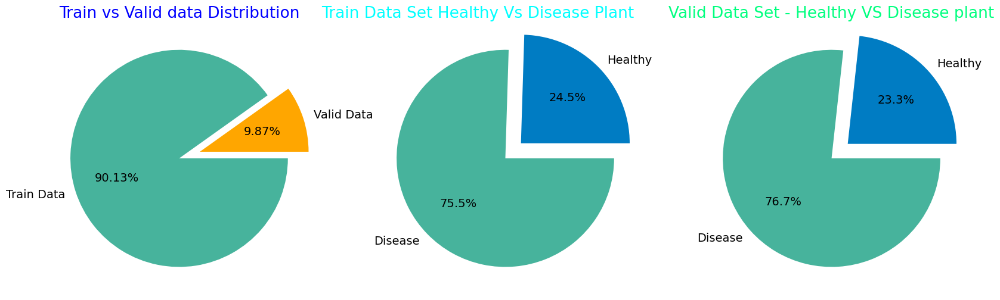

In [ ]:
def image_information(data_set_info):
    plt.rcParams["font.size"]=14
    plt.pie([data_set_info.nb[data_set_info.Category=="healthy"].sum(),data_set_info.nb[data_set_info.Category!="health"].sum()],labels=["Healthy","Disease"],autopct=lambda x:str(round(x,1))+"%",colors=["#007CC3","#47B39C"],shadow=False,explode=(0.20,0))


plt.figure(figsize=(20,20))
plt.subplot(1,3,1)
plt.title("Train vs Valid data Distribution",fontsize=19,color="Blue")
plt.rcParams["font.size"]=14

# image_information(valid_data_count)
plt.pie([valid_data_count.nb.sum(),train_data_count.nb.sum()],labels=["Valid Data","Train Data"],autopct=lambda x: str(round(x,2))+"%",colors=["#FFA600","#47B39C"],shadow=False,explode=(0.20,0))
plt.subplot(1,3,2)
plt.title("Train Data Set Healthy Vs Disease Plant "        "          "  ,fontsize=19,color="aqua")
image_information(train_data_count)
plt.subplot(1,3,3)
plt.title('Valid Data Set - Healthy VS Disease plant', fontsize=19,color="springgreen")
image_information(valid_data_count)

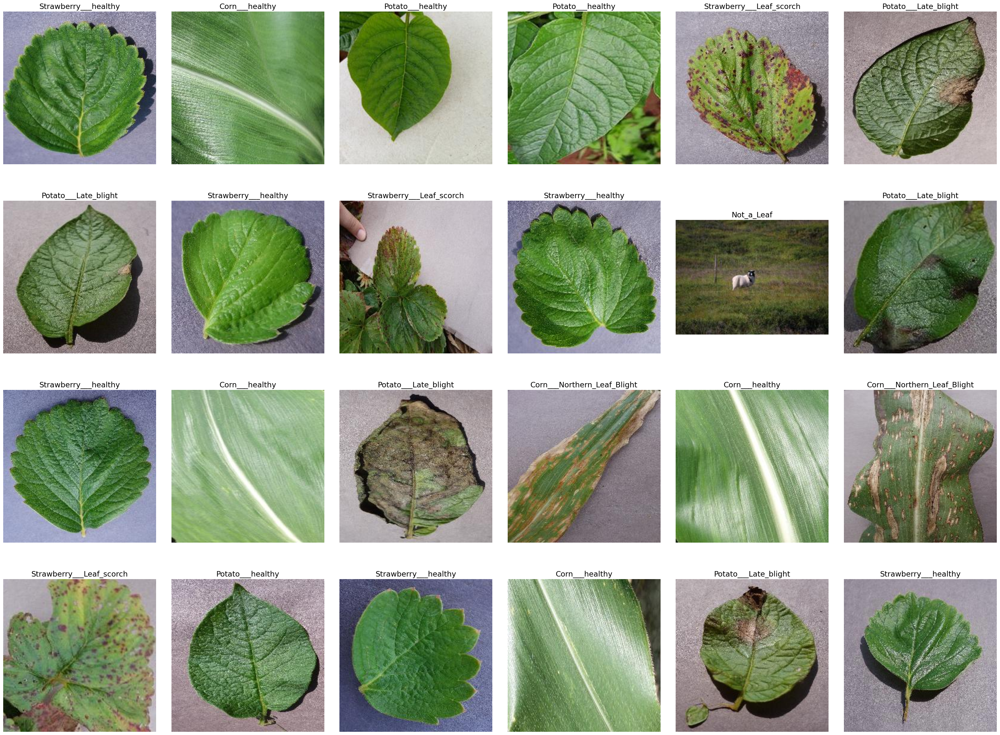

In [ ]:
plt.figure(figsize=(40,30))
plt.subplots_adjust(wspace=0.1, hspace=0.1)

for i in range(24):
    random_folder = np.random.randint(0, len(os.listdir(image_path)))
    random_folder_path = os.path.join(image_path, os.listdir(image_path)[random_folder])
    random_image = np.random.randint(0, len(os.listdir(random_folder_path)))
    random_image_path = os.path.join(random_folder_path, os.listdir(random_folder_path)[random_image])
    image = cv2.imread(random_image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Get the class name for the current image
    class_name = class_names[random_folder]

    plt.subplot(4, 6, i + 1)
    plt.imshow(image)
    plt.axis("off")
    plt.title(class_name)

plt.show()

In [ ]:
print("Number of classes : {}".format(len(class_names)))

Number of classes : 9


In [ ]:
numberof_images={}
for class_name in class_names:
    numberof_images[class_name]=len(os.listdir(image_path+"/"+class_name))
images_each_class=pd.DataFrame(numberof_images.values(),index=numberof_images.keys(),columns=["Number of images"])
images_each_class

,Number of images
Corn___Common_rust,1060
Corn___healthy,1031
Corn___Northern_Leaf_Blight,1031
Not_a_Leaf,1071
Potato___Early_blight,1011
Potato___healthy,1000
Potato___Late_blight,1061
Strawberry___healthy,1000
Strawberry___Leaf_scorch,1069


In [7]:
IMG_WIDTH = 224
IMG_HEIGHT = 224
batch_size=32
num_classes=9

In [8]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale=1.0/255,
    zoom_range=0.2,
    width_shift_range=0.2,
    height_shift_range=0.2,
    fill_mode='nearest',
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=35,
    brightness_range=[0.9, 1.1]
)

train_generator = train_datagen.flow_from_directory(train_image_path,
                                                   target_size=(IMG_WIDTH, IMG_HEIGHT),
                                                   batch_size=batch_size,
                                                   class_mode='sparse',
                                                   color_mode='rgb',
                                                   shuffle=True)

Found 9334 images belonging to 9 classes.


In [9]:
validation_datagen = ImageDataGenerator(rescale=1.0/255)
validation_generator = validation_datagen.flow_from_directory(valid_image_path,
                                                               target_size=(IMG_WIDTH, IMG_HEIGHT),
                                                               batch_size=batch_size,
                                                               class_mode='sparse',
                                                               color_mode='rgb',
                                                               shuffle=True)


Found 1022 images belonging to 9 classes.


In [10]:
# testdata_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

# test_data_generator = testdata_generator.flow_from_directory(test_image_path,
#                                                              batch_size=batch_size,
#                                                              class_mode='sparse',
#                                                              target_size=(IMG_WIDTH, IMG_HEIGHT),
#                                                              color_mode='rgb',
#                                                              shuffle=False)


Found 998 images belonging to 9 classes.


In [ ]:
train_number=train_generator.samples
valid_number=validation_generator.samples

In [ ]:
def create__model():
    # Define VGG19 model
    vgg = VGG19(weights="imagenet", include_top=False, input_shape=(IMG_WIDTH, IMG_HEIGHT, 3))

    for layer in vgg.layers:
        layer.trainable = False

    model = Sequential()
    model.add(vgg)
    model.add(Flatten())
    model.add(Dense(9, activation="softmax"))  # Output layer with 9 classes

    optimizer = Adam(learning_rate=0.0001)
    model.compile(optimizer=optimizer, loss="sparse_categorical_crossentropy", metrics=["accuracy"])

    return model

In [ ]:
vgg_model = create__model()

80134624/80134624 [==============================] - 5s 0us/step


In [ ]:
print(vgg_model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 9)                 225801    
                                                                 
Total params: 20250185 (77.25 MB)
Trainable params: 225801 (882.04 KB)
Non-trainable params: 20024384 (76.39 MB)
_________________________________________________________________
None


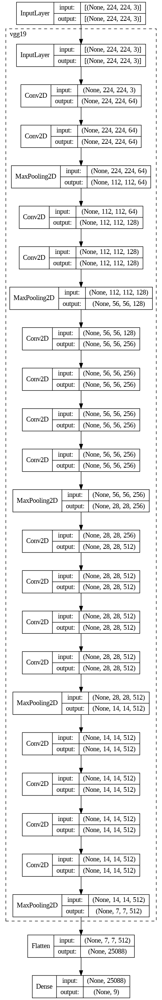

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(vgg_model, expand_nested=True, show_shapes=True, show_layer_names=False)

In [ ]:
# Specify the full path for saving the best model
from tensorflow.keras.callbacks import ModelCheckpoint
model_checkpoint = ModelCheckpoint('/content/drive/MyDrive/NayaProject/vgg19best_of_model.h5', save_best_only=True, monitor='val_loss', mode='min')

In [ ]:
from keras.callbacks import ReduceLROnPlateau

In [ ]:
history = vgg_model.fit(
    train_generator,
    validation_data=validation_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    epochs=15,
    validation_steps=validation_generator.samples // batch_size,
    verbose=2,
    callbacks=[
        ReduceLROnPlateau(monitor='val_loss', factor=np.sqrt(0.1), patience=5),
        model_checkpoint
    ]
)

Epoch 1/15


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


291/291 - 207s - loss: 0.9086 - accuracy: 0.7547 - val_loss: 0.3873 - val_accuracy: 0.9113 - lr: 1.0000e-04 - 207s/epoch - 711ms/step
Epoch 2/15
291/291 - 200s - loss: 0.4154 - accuracy: 0.8951 - val_loss: 0.2671 - val_accuracy: 0.9304 - lr: 1.0000e-04 - 200s/epoch - 686ms/step
Epoch 3/15
291/291 - 200s - loss: 0.3191 - accuracy: 0.9124 - val_loss: 0.2104 - val_accuracy: 0.9365 - lr: 1.0000e-04 - 200s/epoch - 689ms/step
Epoch 4/15
291/291 - 204s - loss: 0.2710 - accuracy: 0.9220 - val_loss: 0.1803 - val_accuracy: 0.9466 - lr: 1.0000e-04 - 204s/epoch - 701ms/step
Epoch 5/15
291/291 - 197s - loss: 0.2408 - accuracy: 0.9312 - val_loss: 0.1561 - val_accuracy: 0.9476 - lr: 1.0000e-04 - 197s/epoch - 676ms/step
Epoch 6/15
291/291 - 198s - loss: 0.2129 - accuracy: 0.9352 - val_loss: 0.1523 - val_accuracy: 0.9506 - lr: 1.0000e-04 - 198s/epoch - 680ms/step
Epoch 7/15
291/291 - 203s - loss: 0.1962 - accuracy: 0.9415 - val_loss: 0.1313 - val_accuracy: 0.9556 - lr: 1.0000e-04 - 203s/epoch - 697ms/s

In [ ]:
# Access metrics from the training history
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

train_loss = history.history['loss']
val_loss = history.history['val_loss']

# If using a learning rate scheduler (e.g., ReduceLROnPlateau)
learning_rate = history.history['lr']

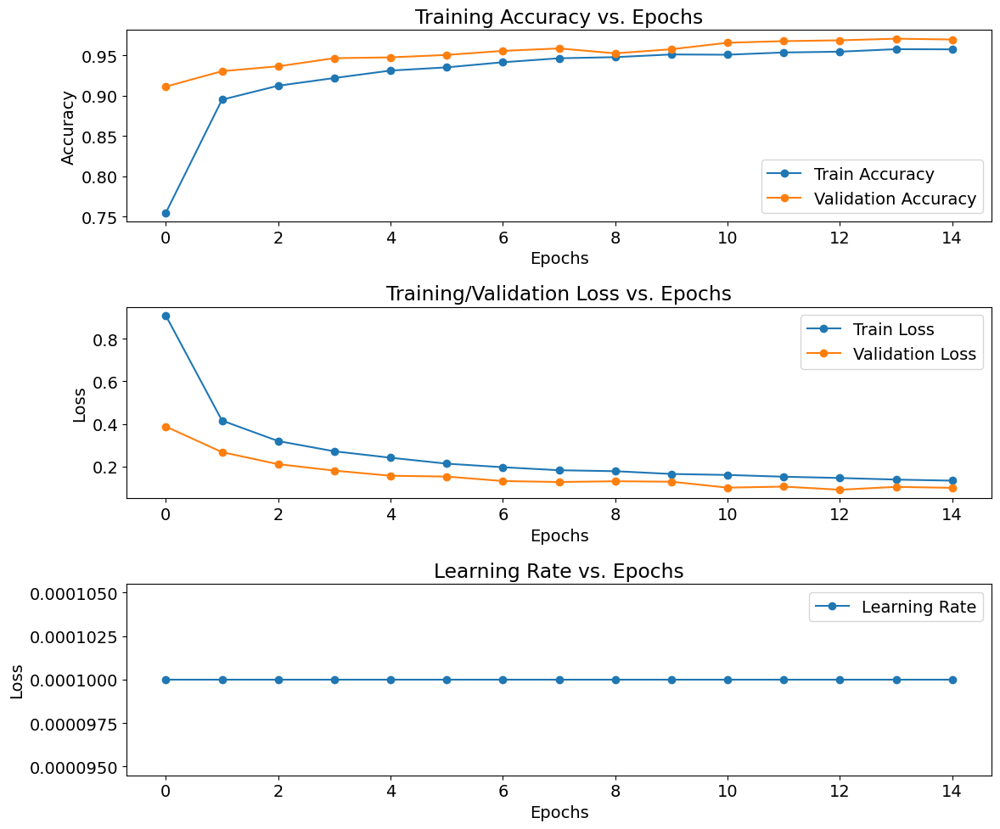

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(12, 10))

ax[0].set_title('Training Accuracy vs. Epochs')
ax[0].plot(train_accuracy, 'o-', label='Train Accuracy')
ax[0].plot(val_accuracy, 'o-', label='Validation Accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].legend(loc='best')

ax[1].set_title('Training/Validation Loss vs. Epochs')
ax[1].plot(train_loss, 'o-', label='Train Loss')
ax[1].plot(val_loss, 'o-', label='Validation Loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss')
ax[1].legend(loc='best')

ax[2].set_title('Learning Rate vs. Epochs')
ax[2].plot(learning_rate, 'o-', label='Learning Rate')
ax[2].set_xlabel('Epochs')
ax[2].set_ylabel('Loss')
ax[2].legend(loc='best')

plt.tight_layout()
plt.show()

In [ ]:
import pickle
# Specify the file path
history_file_path = '/content/drive/MyDrive/NayaProject/vgg19training_history.pkl'

# Check if the file exists
if os.path.exists(history_file_path):
    # If the file exists, load the existing history
    with open(history_file_path, 'rb') as file:
        existing_history = pickle.load(file)

    # Merge the existing history with the new history
    for key in existing_history:
        existing_history[key].extend(history.history[key])

    # Save the merged history back to the file
    with open(history_file_path, 'wb') as file:
        pickle.dump(existing_history, file)

    print(f"Training history merged and saved to: {history_file_path}")

else:
    # If the file doesn't exist, save the new history to it
    with open(history_file_path, 'wb') as file:
        pickle.dump(history.history, file)

    print(f"Training history saved to a new file: {history_file_path}")

Training history saved to a new file: /content/drive/MyDrive/NayaProject/vgg19training_history.pkl


In [ ]:
vgg_model.save("/content/drive/MyDrive/NayaProject/square_vgg_model2.keras")

In [ ]:
vgg_model.save("/content/drive/MyDrive/NayaProject/square_vgg_model2.h5")

In [11]:
from tensorflow.keras.models import load_model

loaded_vggmodel = load_model("/content/drive/MyDrive/NayaProject/vgg19best_of_model.h5")

In [42]:
realtimetest= "/content/drive/MyDrive/NayaProject/NayaData/realtimetest/"

In [43]:
realtestdata_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
realtest_data_generator = realtestdata_generator.flow_from_directory(realtimetest,
                                                             batch_size=batch_size,
                                                             class_mode='sparse',
                                                             target_size=(IMG_WIDTH, IMG_HEIGHT),
                                                             color_mode='rgb',
                                                             shuffle=False)


Found 41 images belonging to 9 classes.


In [14]:
labels = {value: key for key, value in train_generator.class_indices.items()}

print("Label Mappings for classes present in the training and validation datasets\n")
for key, value in labels.items():
    print(f"{key} : {value}")

Label Mappings for classes present in the training and validation datasets

0 : Corn___Common_rust
1 : Corn___Northern_Leaf_Blight
2 : Corn___healthy
3 : Not_a_Leaf
4 : Potato___Early_blight
5 : Potato___Late_blight
6 : Potato___healthy
7 : Strawberry___Leaf_scorch
8 : Strawberry___healthy


In [15]:
import os
import random
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing import image

1/1 [==============================] - 1s 670ms/step


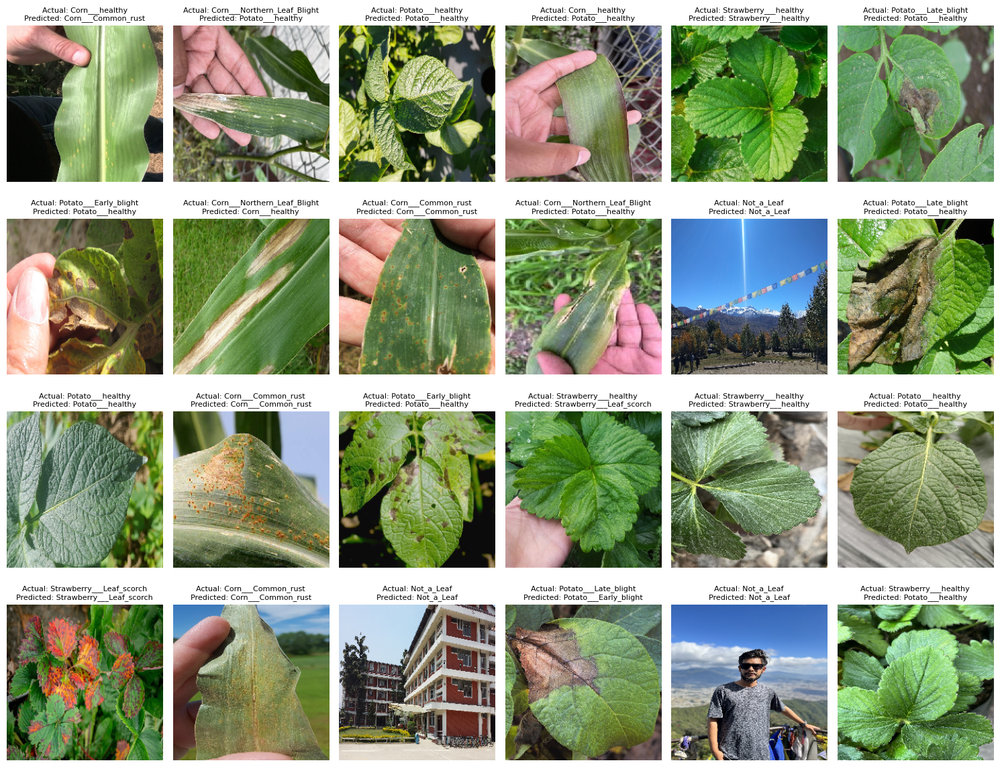

In [ ]:
import random
image_files = []
for root, dirs, files in os.walk(realtimetest):
    for file in files:
        if file.startswith('.') or os.path.isdir(os.path.join(root, file)):  # Skip hidden files and directories
            continue
        image_files.append(os.path.join(root, file))

# Shuffle the image files
random.shuffle(image_files)

# Take the first 24 images if available, or all images if less than 18
num_images = min(24, len(image_files))
image_files = image_files[:num_images]

# Calculate the number of rows and columns for the subplot grid
num_rows = 4
num_cols = 6
# Create a subplot grid for the images
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15,12))
fig.subplots_adjust(wspace=0.5, hspace=0.2)  # Adjust horizontal and vertical spacing

for i, image_path in enumerate(image_files):
    # Load and preprocess the image
    image_obj = image.load_img(image_path, target_size=(IMG_WIDTH, IMG_HEIGHT))
    image_array = image.img_to_array(image_obj)
    image_array = np.expand_dims(image_array, axis=0)
    image_array /= 255.0

    # Predict the class of the image using the loaded model
    prediction = loaded_vggmodel.predict(image_array)
    predicted_class_index = np.argmax(prediction)
    predicted_class_name = labels[predicted_class_index]
    #confidence_percentage = prediction[0, predicted_class_index] * 100

    # Extract actual class name from the folder name
    actual_class_name = os.path.basename(os.path.dirname(image_path))

    # Display the image with actual and predicted class names
    row_index = i // num_cols
    col_index = i % num_cols

    axes[row_index, col_index].imshow(image_obj)
    axes[row_index, col_index].set_title(f"Actual: {actual_class_name}\nPredicted: {predicted_class_name}", fontsize=8)
    axes[row_index, col_index].axis("off")

# Adjust the layout and show the plot
plt.tight_layout()
plt.show()

In [44]:
# Evaluate the model on the test set
test_loss, test_accuracy = loaded_vggmodel.evaluate(realtest_data_generator)

2/2 [==============================] - 29s 6s/step - loss: 2.0554 - accuracy: 0.6585


In [45]:
print(f"Test Loss:     {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

Test Loss:     2.0554111003875732
Test Accuracy: 0.6585366129875183


In [46]:
realpredictions = loaded_vggmodel.predict(realtest_data_generator)

2/2 [==============================] - 29s 7s/step


In [47]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix,f1_score
y_true = realtest_data_generator.classes
y_pred = np.argmax(realpredictions, axis=1)

accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

# Confusion Matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Print the computed metrics
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")
print(f"Confusion Matrix:\n{conf_matrix}")

Accuracy: 0.6585365853658537
Precision: 0.7934959349593496
Recall: 0.6585365853658537
F1 Score: 0.6556523422377081
Confusion Matrix:
[[4 0 0 0 0 0 1 0 0]
 [0 2 1 0 0 0 2 0 0]
 [1 0 1 0 0 0 2 0 0]
 [0 0 0 5 0 0 0 0 0]
 [0 0 0 0 2 0 2 0 0]
 [0 0 0 0 1 1 2 0 0]
 [0 0 0 0 0 0 5 0 0]
 [0 0 0 0 0 0 0 4 0]
 [0 0 0 0 0 0 1 1 3]]


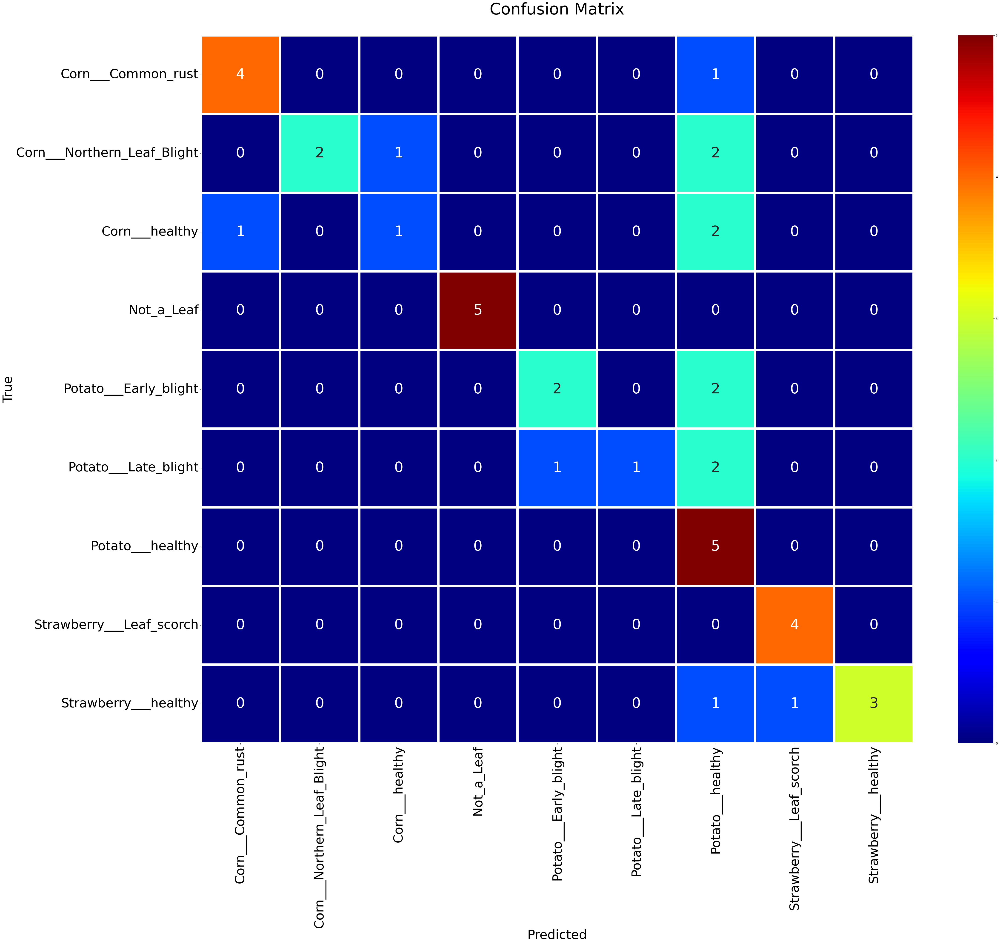

In [48]:
plt.figure(figsize=(50,40))
confusion = confusion_matrix(y_true, y_pred)

sns.heatmap(confusion, annot=True, fmt='d', cmap='jet', xticklabels=[labels[i] for i in range(len(labels))],
            yticklabels=[labels[i] for i in range(len(labels))], lw=6, annot_kws={"size": 45})
plt.xlabel('Predicted', fontsize=40, color="black")
plt.ylabel('True', fontsize=40, color="black")
plt.title('Confusion Matrix\n', fontsize=50, color="black")

plt.xticks(fontsize=40, rotation=90, color="black")
plt.yticks(fontsize=40, rotation=0, color="black")
plt.show()

In [50]:
print(classification_report(y_true, y_pred, target_names=[labels[i] for i in range(len(labels))]))

                             precision    recall  f1-score   support

         Corn___Common_rust       0.80      0.80      0.80         5
Corn___Northern_Leaf_Blight       1.00      0.40      0.57         5
             Corn___healthy       0.50      0.25      0.33         4
                 Not_a_Leaf       1.00      1.00      1.00         5
      Potato___Early_blight       0.67      0.50      0.57         4
       Potato___Late_blight       1.00      0.25      0.40         4
           Potato___healthy       0.33      1.00      0.50         5
   Strawberry___Leaf_scorch       0.80      1.00      0.89         4
       Strawberry___healthy       1.00      0.60      0.75         5

                   accuracy                           0.66        41
                  macro avg       0.79      0.64      0.65        41
               weighted avg       0.79      0.66      0.66        41



In [52]:
# Generate classification report
report = classification_report(y_true, y_pred, target_names=labels.values(), output_dict=True)

# Convert classification report to DataFrame
report_df = pd.DataFrame(report).transpose()

# Set border for DataFrame cells
styles = [
    dict(selector="td", props=[("border", "1px solid black")]),
    dict(selector="th", props=[("border", "1px solid black")])
]

# Apply border styles to the DataFrame
styled_report_df = report_df.style.set_table_styles(styles)

# Display the styled DataFrame
styled_report_df


,precision,recall,f1-score,support
Corn___Common_rust,0.800000,0.800000,0.800000,5.000000
Corn___Northern_Leaf_Blight,1.000000,0.400000,0.571429,5.000000
Corn___healthy,0.500000,0.250000,0.333333,4.000000
Not_a_Leaf,1.000000,1.000000,1.000000,5.000000
Potato___Early_blight,0.666667,0.500000,0.571429,4.000000
Potato___Late_blight,1.000000,0.250000,0.400000,4.000000
Potato___healthy,0.333333,1.000000,0.500000,5.000000
Strawberry___Leaf_scorch,0.800000,1.000000,0.888889,4.000000
Strawberry___healthy,1.000000,0.600000,0.750000,5.000000
accuracy,0.658537,0.658537,0.658537,0.658537


2/2 [==============================] - 29s 5s/step


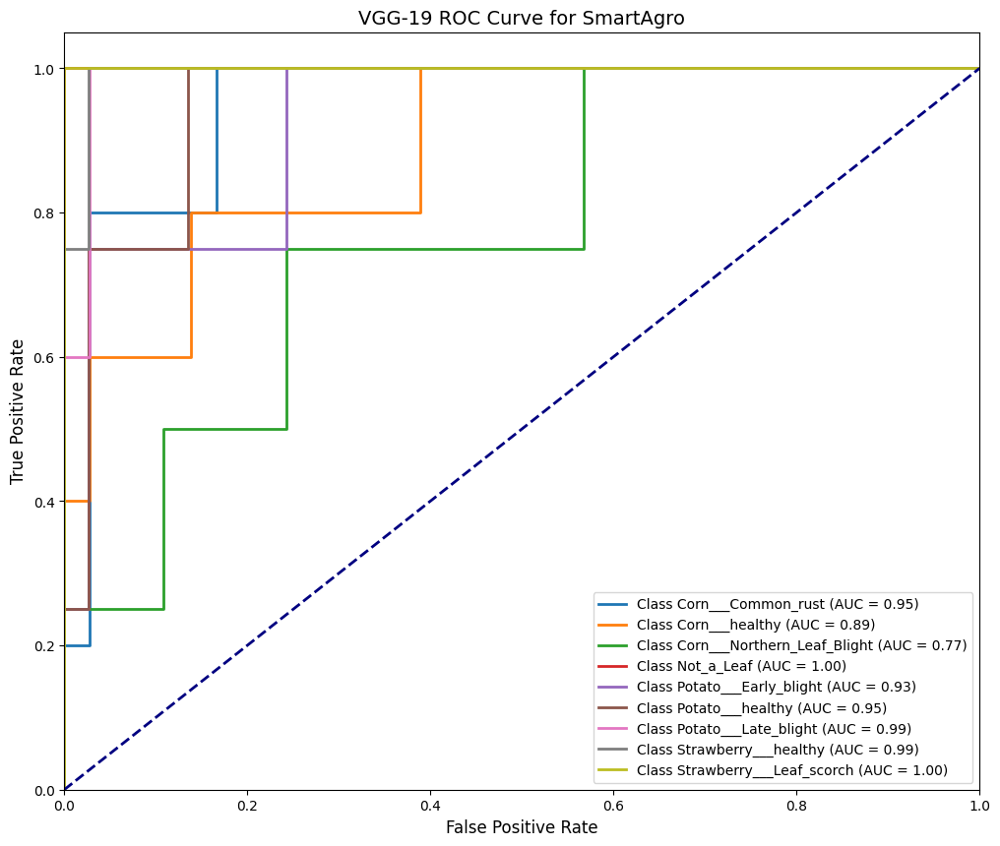

In [53]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Assuming you already have predictions, y_true, and class_names defined
realpredictions = loaded_vggmodel.predict(realtest_data_generator)
y_true = realtest_data_generator.classes
num_classes = len(class_names)

# Compute ROC curve and ROC area for each class
plt.figure(figsize=(12, 10))
for i in range(num_classes):
    fpr, tpr, _ = roc_curve(y_true, realpredictions[:, i], pos_label=i)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'Class {class_names[i]} (AUC = {roc_auc:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title('VGG-19 ROC Curve for SmartAgro', fontsize=14)
plt.legend(loc="lower right", fontsize=10)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()


1/1 [==============================] - 2s 2s/step


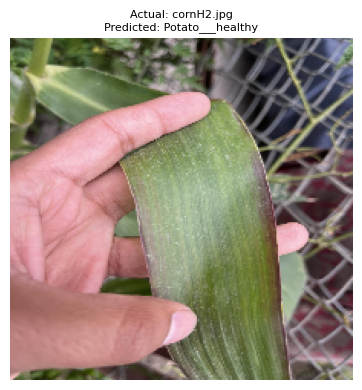

In [31]:
import matplotlib.pyplot as plt
import os
import numpy as np
from keras.preprocessing import image

# Calculate the number of rows and columns for the subplot grid
num_rows = 1
num_cols = 1

# Calculate the figure size based on the original image aspect ratio
fig_width = 4
fig_height = 4

# Create a subplot grid for the image
fig, axes = plt.subplots(num_rows, num_cols, figsize=(fig_width, fig_height))
fig.subplots_adjust(wspace=0.5, hspace=0.5)  # Adjust horizontal and vertical spacing

# Specify the path to the image you want to predict
#specific_image_path = "/content/drive/MyDrive/NayaProject/NayaData/realtimetest/Corn___Northern_Leaf_Blight/cornNLB5.jpg"
specific_image_path = "/content/drive/MyDrive/NayaProject/NayaData/realtimetest/Corn___healthy/cornH2.jpg"


# Extract actual class name from the file name (assuming the file name structure is known)
actual_class_name = os.path.basename(specific_image_path).split("_")[0]  # Adjust based on your file naming convention

# Load and preprocess the specified image
specific_image = image.load_img(specific_image_path, target_size=(IMG_WIDTH, IMG_HEIGHT))
specific_image_array = image.img_to_array(specific_image)
specific_image_array = np.expand_dims(specific_image_array, axis=0)
specific_image_array /= 255.0

# Predict the class of the specified image using the loaded model
prediction = loaded_vggmodel.predict(specific_image_array)
predicted_class_index = np.argmax(prediction)
predicted_class_name = labels[predicted_class_index]
confidence_percentage = prediction[0, predicted_class_index] * 100

# Display the specified image with actual and predicted class names
axes.imshow(specific_image)
axes.set_title(f"Actual: {actual_class_name}\nPredicted: {predicted_class_name}", fontsize=8)
axes.axis("off")

# Adjust the layout and show the plot
plt.tight_layout()
plt.show()